# Otoczka wypukła

In [1]:
from functools import cmp_to_key
import random
import numpy as np
import pandas as pd
from bitalg.tests.test2 import Test
from bitalg.visualizer.main import Visualizer

### Przykładowe zastosowanie narzędzia do wizualizacji

In [2]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

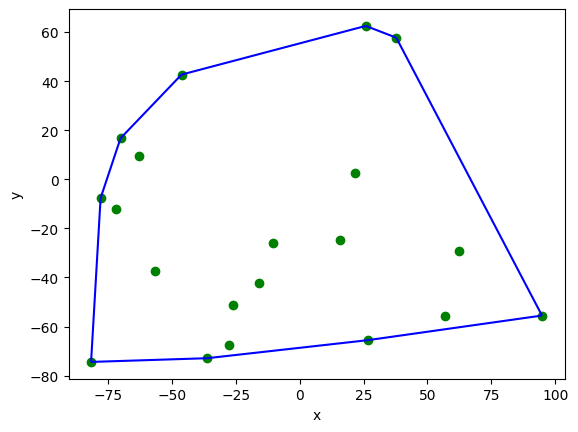

In [3]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [4]:
def generate_uniform_points(left, right, n ):
    points=[[0,0]for i in range (n)]
    for i in range(n):
        points[i][0]=random.uniform(left,right)
        points[i][1]=random.uniform(left,right)
    return points

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [5]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

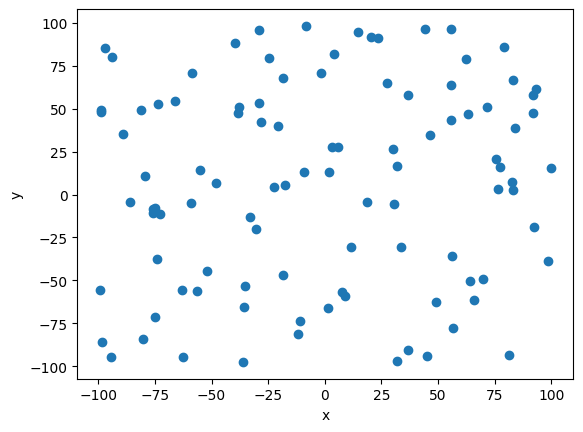

In [6]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a)
vis.show()

Uzupełnij funkcję ```generate_circle_points```.

In [7]:
def generate_circle_points(O, R, n ):
    points=[[None,None]for i in range(n)]
    for i in range(n//2):
        points[i][0]=random.uniform(-R,R)
        points[i][1]=random.choice([-(R**2-points[i][0]**2)**0.5,(R**2-points[i][0]**2)**0.5])
        points[i][0]+=O[0]
        points[i][1]+=O[1]
    for i in range(n//2,n):
        points[i][1]=random.uniform(-R,R)
        points[i][0]=random.choice([-(R**2-points[i][1]**2)**0.5,(R**2-points[i][1]**2)**0.5])
        points[i][0]+=O[0]
        points[i][1]+=O[1]
    return points

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [8]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

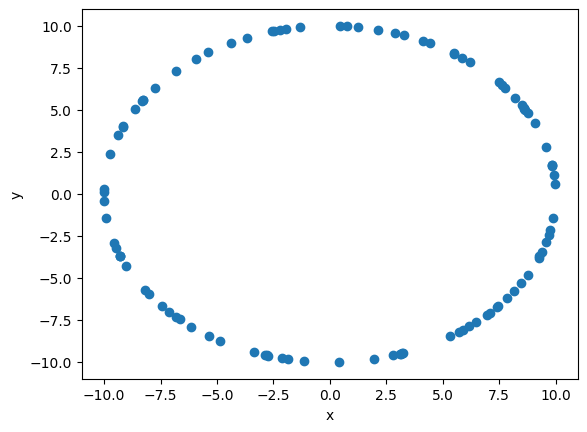

In [9]:
# visualize(points_b)
vis.clear()
vis.add_point(points_b)
vis.show()

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [10]:
def generate_collinear_point(a, b):
    ##y=mx+c
    point=[None,None]
    if a[0]-b[0]!=0:
        m=(a[1]-b[1])/(a[0]-b[0])
        c=a[1]-m*a[0]
        
        point[0]=random.uniform(min(a[0],b[0]),max(a[0],b[0]))
        point[1]=point[0]*m+c
    else:
        point[0]=a[0]
        point[1]=random.uniform(min(a[1],b[1]),max(a[1],b[1]))
    return point

In [11]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    points=[[None,None]for i in range(n)]
    lines=[[a,b],[b,c],[c,d],[d,a]]
    for i in range(n):
        line=random.choice(lines)
        points[i]=generate_collinear_point(line[0],line[1])
    return points


<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [12]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

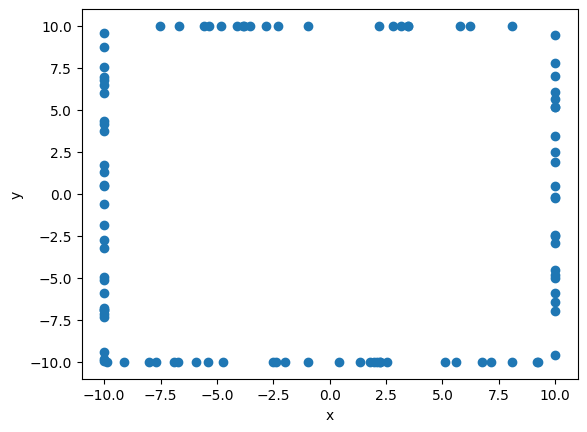

In [13]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c)
vis.show()

Uzupełnij funkcję ```generate_square_points```.

In [14]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    #axis:ab,ad diag:ac,bd
    axes=[[a,b],[a,d]]
    diags=[[a,c],[b,d]]
    points=[[None,None]for i in range(axis_n+diag_n)]
    for i in range(axis_n):
        line=random.choice(axes)
        points[i]=generate_collinear_point(line[0],line[1])
    for i in range(axis_n,axis_n+diag_n):
        line=random.choice(diags)
        points[i]=generate_collinear_point(line[0],line[1])
    points.append(a)
    points.append(b)
    points.append(c)
    points.append(d)


    return points

<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [15]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 50, 50)

Zwizualizuj wygenerowane punkty.

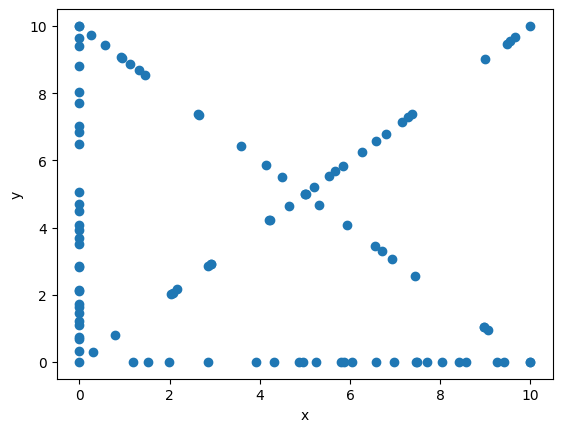

In [16]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d)
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [52]:


def graham_algorithm(points):
    
    def orientation(p, q, r):
        val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
        if val == 0:
            return 0  
        return 1 if val > 0 else 2  

    n = len(points)
    if n < 3:
        return points  
    if n==3:
        if orientation(points[0],points[1],points[2])==0:
            points = sorted(points, key=lambda x: (x[1], x[0]))
            points=[points[0],points[1]]
        return points
     


    
    min_idx = 0
    for i in range(1, n):
        if points[i][1] < points[min_idx][1] or (points[i][1] == points[min_idx][1] and points[i][0] < points[min_idx][0]):
            min_idx = i

   
    points[0], points[min_idx] = points[min_idx], points[0]

    
    def compare(p1, p2):
        o = orientation(points[0], p1, p2)
        if o == 0:
            return -1 if (p1[0] + p1[1] < p2[0] + p2[1]) else 1
        return -1 if o == 2 else 1

    points[1:] = sorted(points[1:], key=lambda x: (x[1], x[0]))
    points[1:] = sorted(points[1:], key=cmp_to_key(compare))

    
    stack = [points[0], points[1],points[2]]
    for i in range(3, n):
        while len(stack) > 1 and orientation(stack[-2], stack[-1], points[i]) != 2:
            stack.pop()
        stack.append(points[i])

    return stack

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [18]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: 

Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.846s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [19]:
def graham_algorithm_draw(Q):
    vis = Visualizer()
    vis.add_point(Q)

    def orientation(p, q, r):
        val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
        if val == 0:
            return 0  
        return 1 if val > 0 else 2 

    n = len(Q)
    if n < 3:
        return Q  
    if n == 3:
        if orientation(Q[0], Q[1], Q[2]) == 0:
            Q = sorted(Q, key=lambda x: (x[1], x[0]))
            Q = [Q[0], Q[1]]
        return Q

    min_idx = 0
    for i in range(1, n):
        if Q[i][1] < Q[min_idx][1] or (Q[i][1] == Q[min_idx][1] and Q[i][0] < Q[min_idx][0]):
            min_idx = i

    Q[0], Q[min_idx] = Q[min_idx], Q[0]

    def compare(p1, p2):
        o = orientation(Q[0], p1, p2)
        if o == 0:
            return -1 if (p1[0] + p1[1] < p2[0] + p2[1]) else 1
        return -1 if o == 2 else 1

    Q[1:] = sorted(Q[1:], key=lambda x: (x[1], x[0]))
    Q[1:] = sorted(Q[1:], key=cmp_to_key(compare))

    
    S=[]
    S.append((Q[0],None,vis.add_point(Q[0],color='purple')))
    S.append((Q[1],vis.add_line_segment((Q[1],Q[0]),color='green'),vis.add_point(Q[1],color='purple')))
    S.append((Q[2],vis.add_line_segment((Q[2],Q[1]),color='green'),vis.add_point(Q[2],color='purple')))
    
    for i in range(3,len(Q)):
        p1=vis.add_point(Q[i],color='red')
        l2=vis.add_line_segment((S[-1][0],Q[i]),color='green')
        while len(S)>1 and orientation(S[-2][0],S[-1][0],Q[i])!=2:
            vis.remove_figure(l2)
            vis.remove_figure(S[-1][1])
            vis.remove_figure(S[-1][2])
            S.pop()
            l2=vis.add_line_segment((S[-1][0],Q[i]),color='green')
        vis.remove_figure(p1)
        
        S.append((Q[i],l2,vis.add_point(Q[i],color='purple')))

    for i in range(len(S)):
        S[i] = S[i][0]
    return S, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [20]:
graham_points_a, vis_graham_a = graham_algorithm_draw(points_a)

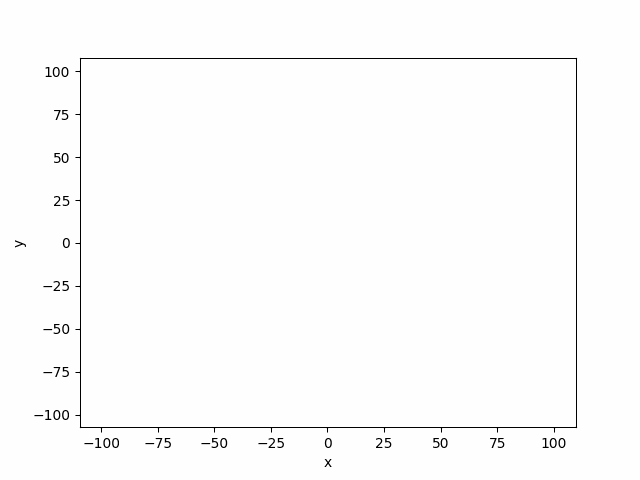

In [21]:
vis_graham_a.show_gif(interval=80)

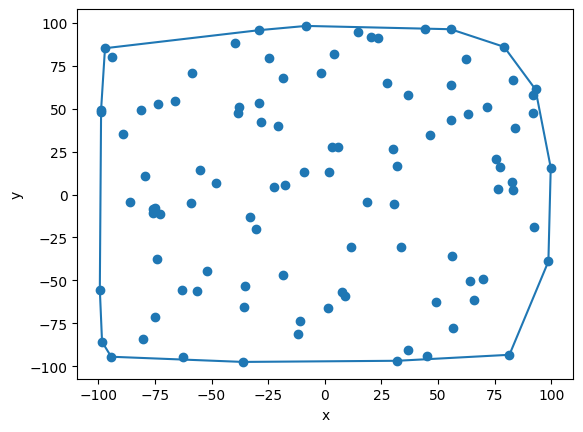

In [22]:
# visualize(graham_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)])
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]])
vis.show()

Zbiór danych B

In [23]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)

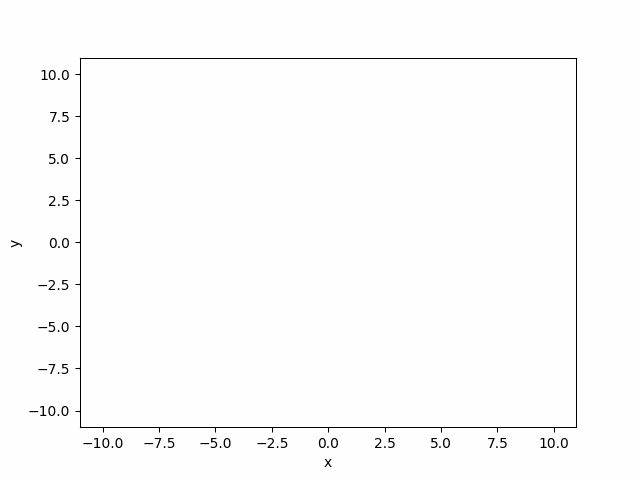

In [24]:
vis_graham_b.show_gif(interval=80)

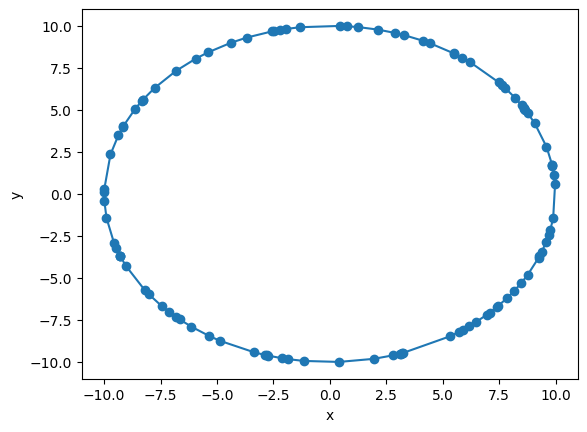

In [25]:
# visualize(graham_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)])
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]])
vis.show()

Zbiór danych C

In [26]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)

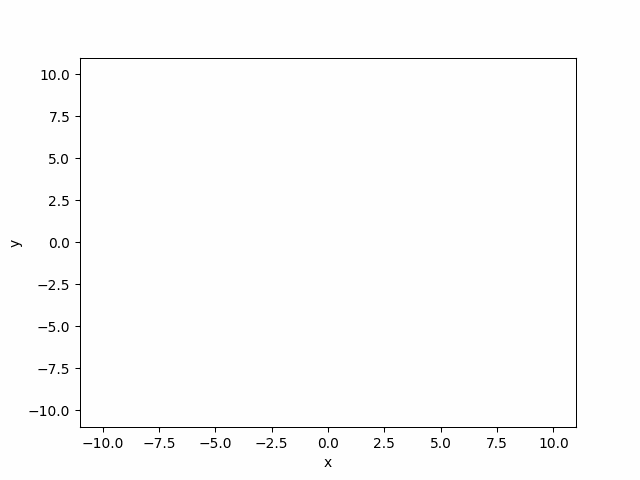

In [27]:
vis_graham_c.show_gif(interval=80)

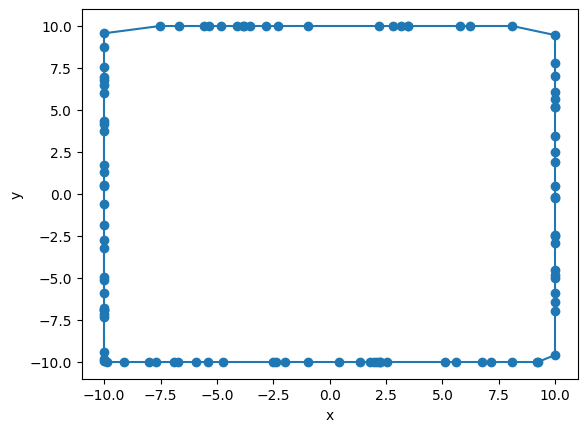

In [28]:
# visualize(graham_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)])
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]])
vis.show()

Zbiór danych D

In [29]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)
print(len(graham_points_d))

4


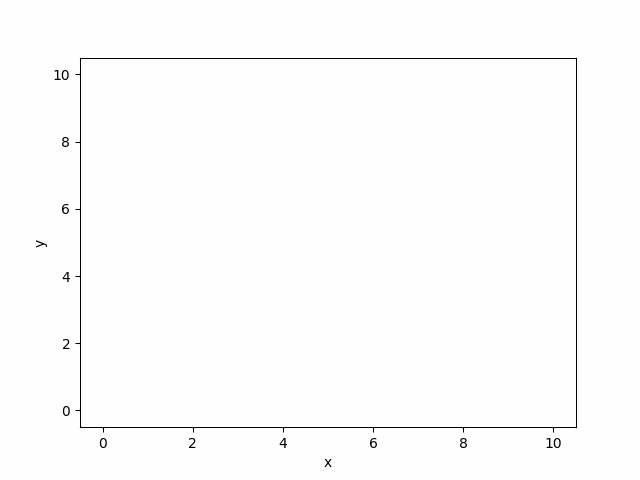

In [30]:
vis_graham_d.show_gif(interval=80)

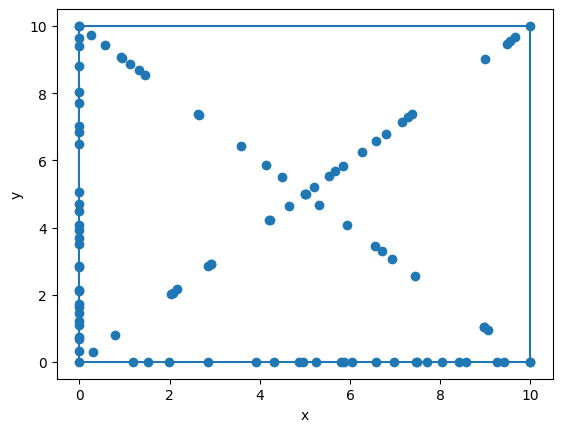

In [31]:
# visualize(graham_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)])
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]])
vis.show()

### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [32]:
def jarvis_algorithm(points):
    n = len(points)
    if n < 3:
        return points  
    if n==3:
        if orientation(points[0],points[1],points[2])==0:
            points = sorted(points, key=lambda x: (x[1], x[0]))
            points=[points[0],points[1]]
        return points

    
    start_point = min(points, key=lambda p: (p[1], p[0]))

    hull = []
    current_point = start_point
    while True:
        hull.append(current_point)
        endpoint = points[0]
        for point in points:
            if point ==current_point:
                continue
            turn = orientation(current_point, endpoint, point)
            if endpoint == current_point or turn == 1 or (turn == 0 and distance(current_point, point) > distance(current_point, endpoint)):
                endpoint = point
        current_point = endpoint
        if current_point == start_point:
            break

    return hull

def orientation(p, q, r):
   
    val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
    if val == 0:
        return 0
    return 1 if val > 0 else -1

def distance(p1, p2):
   
    return (p1[0] - p2[0]) ** 2 + (p1[1] - p2[1]) ** 2

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [33]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: 

Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 3.425s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [34]:
def jarvis_algorithm_draw(points):
    vis=Visualizer()
    vis.add_point(points)
    n = len(points)
    if n < 3:
        return points 
    if n==3:
        if orientation(points[0],points[1],points[2])==0:
            points = sorted(points, key=lambda x: (x[1], x[0]))
            points=[points[0],points[1]]
        return points

    
    start_point = min(points, key=lambda p: (p[1], p[0]))
    vis.add_point(start_point,color="green")

    hull = []
    current_point = start_point
    while True:
        hull.append(current_point)
        endpoint = points[0]
        for point in points:
            if point == current_point:
                continue
            
            
            
            turn = orientation(current_point, endpoint, point)
            if endpoint == current_point or turn == 1 or (turn == 0 and distance(current_point, point) > distance(current_point, endpoint)):
                endpoint = point
            
            
            
        vis.add_line_segment([current_point,endpoint],color="green")
        vis.add_point(endpoint,color="green")

        current_point = endpoint
        
        
        if current_point == start_point:
            break

    return hull,vis

def orientation(p, q, r):
    val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
    if val == 0:
        return 0
    return 1 if val > 0 else -1

def distance(p1, p2):
    return (p1[0] - p2[0]) ** 2 + (p1[1] - p2[1]) ** 2

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [35]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)

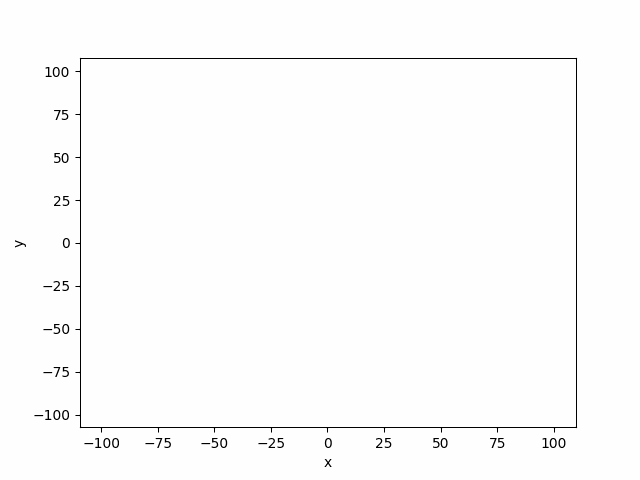

In [36]:
vis_jarvis_a.show_gif(interval=10)

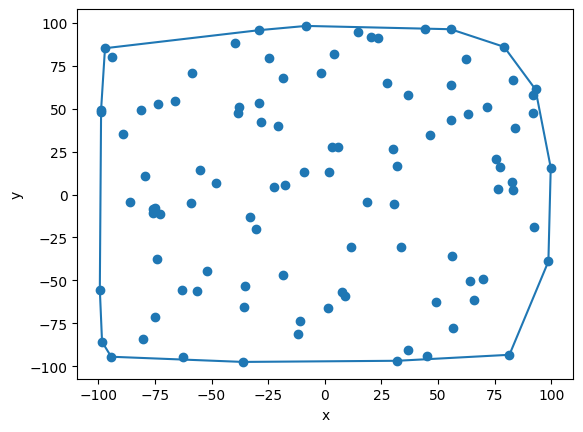

In [37]:
# visualize(jarvis_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)])
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]])
vis.show()

Zbiór danych B

In [38]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)

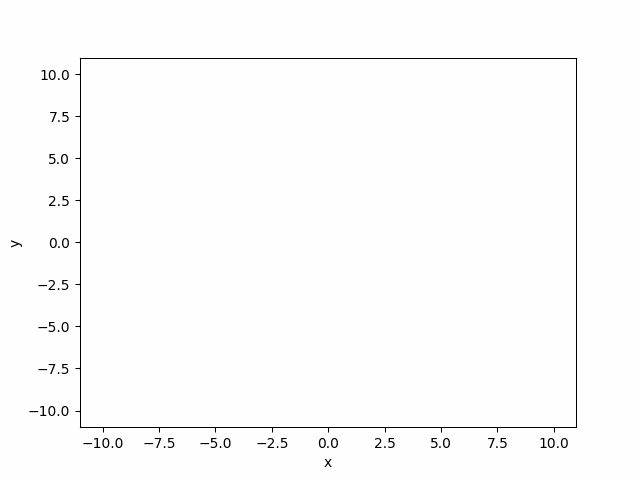

In [39]:
vis_jarvis_b.show_gif()

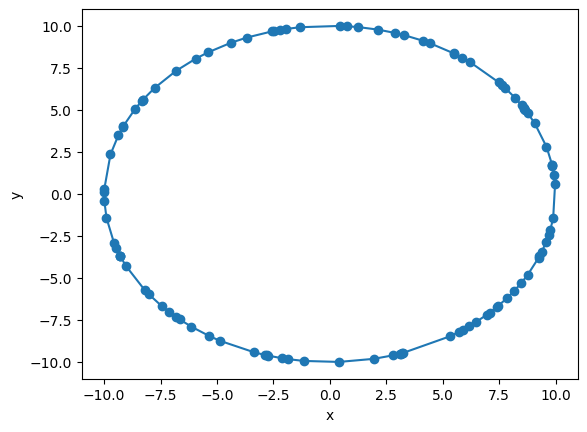

In [40]:
# visualize(jarvis_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)])
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]])
vis.show()

Zbiór danych C

In [41]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)

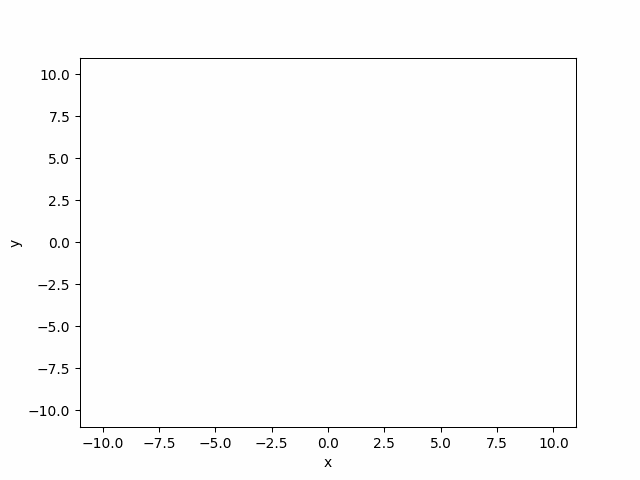

In [42]:
vis_jarvis_c.show_gif()

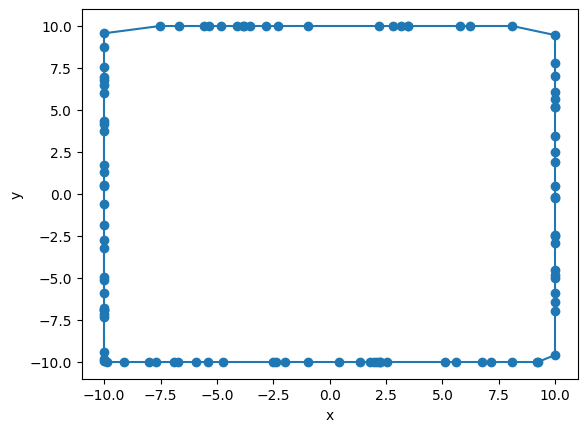

In [43]:
# visualize(jarvis_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)])
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]])
vis.show()

Zbiór danych D

In [44]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)

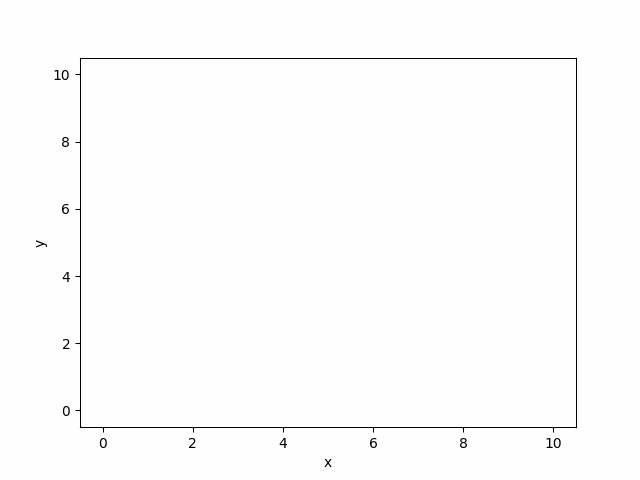

In [45]:
vis_jarvis_d.show_gif()

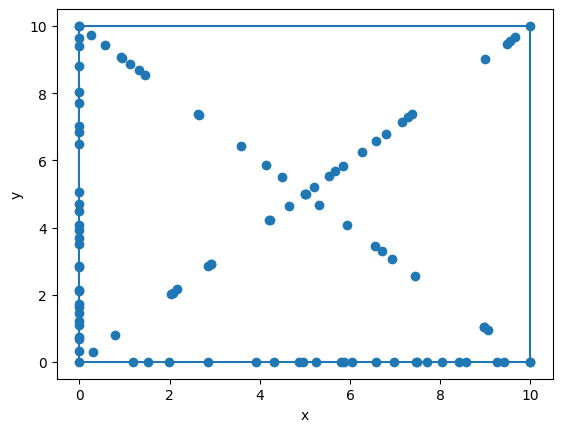

In [46]:
# visualize(jarvis_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)])
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]])
vis.show()


---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [47]:
import time

# Funkcja mierząca czas wykonania innej funkcji
def measure_time(func, *args, **kwargs):
    start_time = time.time()
    result = func(*args, **kwargs)
    end_time = time.time()
    elapsed_time = end_time - start_time
    return result, elapsed_time
datasets = {
    'points_a': points_a,
    'points_b': points_b,
    'points_c': points_c,
    'points_d': points_d
}

# Testowanie czasu działania dla obu algorytmów i zestawów danych
for dataset_name, dataset in datasets.items():
    print(f"Testowanie czasu działania dla {dataset_name}:")
    
    # Testowanie algorytmu Grahama
    result, execution_timeG = measure_time(graham_algorithm, dataset)
    print(f"Algorytm Grahama - Czas wykonania: {execution_timeG} sekundy")
    
    # Testowanie algorytmu Jarvisa
    result, execution_timeJ = measure_time(jarvis_algorithm, dataset)
    print(f"Algorytm Jarvisa - Czas wykonania: {execution_timeJ} sekundy")
    if execution_timeJ>execution_timeG:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Grahama")
    else:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Jarvisa")
    
    print("-" * 40)  # Separator między zestawami danych

Testowanie czasu działania dla points_a:
Algorytm Grahama - Czas wykonania: 0.0007271766662597656 sekundy
Algorytm Jarvisa - Czas wykonania: 0.0008616447448730469 sekundy
Dla zbioru points_a szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_b:
Algorytm Grahama - Czas wykonania: 0.0008800029754638672 sekundy
Algorytm Jarvisa - Czas wykonania: 0.007865428924560547 sekundy
Dla zbioru points_b szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_c:
Algorytm Grahama - Czas wykonania: 0.0004341602325439453 sekundy
Algorytm Jarvisa - Czas wykonania: 0.0006422996520996094 sekundy
Dla zbioru points_c szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_d:
Algorytm Grahama - Czas wykonania: 0.0005567073822021484 sekundy
Algorytm Jarvisa - Czas wykonania: 0.000370025634765625 sekundy
Dla zbioru points_d szybszy był algorytm Jarvisa

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

In [48]:
points_a2 = generate_uniform_points(-100, 100, 1000)
points_b2 = generate_circle_points((10, 10), 10, 1000)
points_c2 = generate_rectangle_points((-10, -10), (10, -10), (10, 10), (-10, 10), 1000)
points_d2=generate_square_points((0, 0), (10, 0), (10, 10), (0, 10), 100, 1000)

In [49]:

datasets = {
    'points_a2': points_a2,
    'points_b2': points_b2,
    'points_c2': points_c2,
    'points_d2': points_d2
}

# Testowanie czasu działania dla obu algorytmów i zestawów danych
for dataset_name, dataset in datasets.items():
    print(f"Testowanie czasu działania dla {dataset_name}:")
    
    # Testowanie algorytmu Grahama
    result, execution_timeG = measure_time(graham_algorithm, dataset)
    print(f"Algorytm Grahama - Czas wykonania: {execution_timeG} sekundy")
    
    # Testowanie algorytmu Jarvisa
    result, execution_timeJ = measure_time(jarvis_algorithm, dataset)
    print(f"Algorytm Jarvisa - Czas wykonania: {execution_timeJ} sekundy")
    if execution_timeJ>execution_timeG:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Grahama")
    else:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Jarvisa")
    
    print("-" * 40)  # Separator między zestawami danych

Testowanie czasu działania dla points_a2:
Algorytm Grahama - Czas wykonania: 0.016860246658325195 sekundy
Algorytm Jarvisa - Czas wykonania: 0.010959863662719727 sekundy
Dla zbioru points_a2 szybszy był algorytm Jarvisa
----------------------------------------
Testowanie czasu działania dla points_b2:
Algorytm Grahama - Czas wykonania: 0.0061495304107666016 sekundy


Algorytm Jarvisa - Czas wykonania: 0.749248743057251 sekundy
Dla zbioru points_b2 szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_c2:
Algorytm Grahama - Czas wykonania: 0.00592350959777832 sekundy
Algorytm Jarvisa - Czas wykonania: 0.007050037384033203 sekundy
Dla zbioru points_c2 szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_d2:
Algorytm Grahama - Czas wykonania: 0.01499485969543457 sekundy
Algorytm Jarvisa - Czas wykonania: 0.013984918594360352 sekundy
Dla zbioru points_d2 szybszy był algorytm Jarvisa
----------------------------------------


In [50]:
points_a3 = generate_uniform_points(-100, 100, 10000)
points_b3 = generate_circle_points((10, 10), 10, 10000)
points_c3 = generate_rectangle_points((-10, -10), (10, -10), (10, 10), (-10, 10), 10000)
points_d3=generate_square_points((0, 0), (10, 0), (10, 10), (0, 10), 100, 10000)

In [51]:
datasets = {
    'points_a3': points_a3,
    'points_b3': points_b3,
    'points_c3': points_c3,
    'points_d3': points_d3
}

# Testowanie czasu działania dla obu algorytmów i zestawów danych
for dataset_name, dataset in datasets.items():
    print(f"Testowanie czasu działania dla {dataset_name}:")
    
    # Testowanie algorytmu Grahama
    result, execution_timeG = measure_time(graham_algorithm, dataset)
    print(f"Algorytm Grahama - Czas wykonania: {execution_timeG} sekundy")
    
    # Testowanie algorytmu Jarvisa
    result, execution_timeJ = measure_time(jarvis_algorithm, dataset)
    print(f"Algorytm Jarvisa - Czas wykonania: {execution_timeJ} sekundy")
    if execution_timeJ>execution_timeG:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Grahama")
    else:
        print(f"Dla zbioru {dataset_name} szybszy był algorytm Jarvisa")
    
    print("-" * 40)  # Separator między zestawami danych

Testowanie czasu działania dla points_a3:
Algorytm Grahama - Czas wykonania: 0.5370252132415771 sekundy


Algorytm Jarvisa - Czas wykonania: 0.30991053581237793 sekundy
Dla zbioru points_a3 szybszy był algorytm Jarvisa
----------------------------------------
Testowanie czasu działania dla points_b3:
Algorytm Grahama - Czas wykonania: 0.0562286376953125 sekundy
Algorytm Jarvisa - Czas wykonania: 65.33342623710632 sekundy
Dla zbioru points_b3 szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_c3:
Algorytm Grahama - Czas wykonania: 0.03748440742492676 sekundy
Algorytm Jarvisa - Czas wykonania: 0.05218863487243652 sekundy
Dla zbioru points_c3 szybszy był algorytm Grahama
----------------------------------------
Testowanie czasu działania dla points_d3:
Algorytm Grahama - Czas wykonania: 0.04849052429199219 sekundy
Algorytm Jarvisa - Czas wykonania: 0.028609752655029297 sekundy
Dla zbioru points_d3 szybszy był algorytm Jarvisa
----------------------------------------


WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
